In [10]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#set background color grey
sns.set_theme(style="darkgrid")

In [11]:
df = pd.read_csv("all_turns_2.csv")

df.drop(columns=['Unnamed: 0'], inplace=True)
df['turn_duration'] = 0.2*(df['end_idx'].astype('float') - df['start_idx'].astype('float'))
df.describe().T

,count,mean,std,min,25%,50%,75%,max
participant_id,210.0,1838.609524,619.424474,407.000000,2102.000000,2105.000000,2107.000000,2111.000000
path_num,210.0,2.247619,0.735705,1.000000,2.000000,2.000000,3.000000,3.000000
turn_num,210.0,2.642857,1.785393,1.000000,1.000000,2.000000,3.750000,10.000000
start_idx,210.0,539.523810,430.918594,50.000000,246.000000,435.500000,666.000000,2199.000000
end_idx,210.0,590.380952,430.636602,83.000000,296.250000,483.000000,712.000000,2264.000000
walking_direction_lag,210.0,-3.980952,24.546014,-151.000000,-12.000000,-1.000000,6.000000,107.000000
walking_direction_base_corr,210.0,0.075067,0.415642,-0.857578,-0.315052,0.093226,0.413633,0.941918
walking_direction_lagged_corr,210.0,0.470502,0.163364,0.122957,0.348448,0.442860,0.570997,0.955078
walking_direction_dtw,210.0,43.989552,27.188144,4.239983,25.985486,36.686731,52.961837,162.955230
speeds_lag,210.0,-1.814286,15.690145,-69.000000,-8.000000,-1.000000,4.000000,62.000000


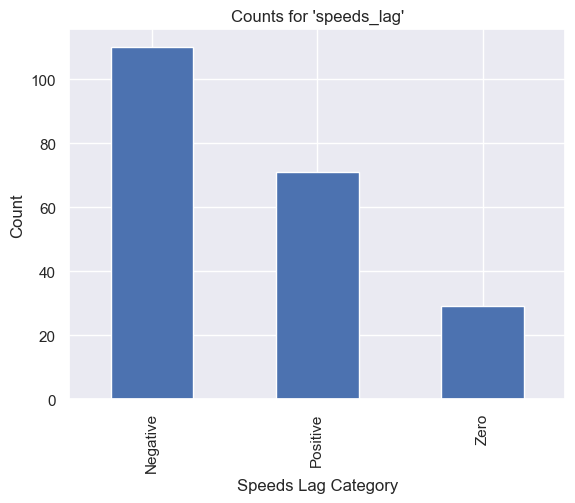

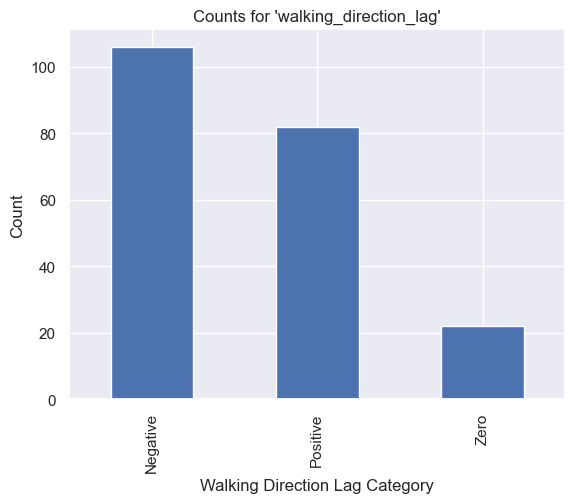

In [12]:
# Count for 'speeds_lag'
speeds_lag_counts = df['speeds_lag'].apply(lambda x: 'Negative' if x < 0 else ('Zero' if x == 0 else 'Positive')).value_counts()

# Count for 'walking_speed_lag'
walking_speed_lag_counts = df['walking_direction_lag'].apply(lambda x: 'Negative' if x < 0 else ('Zero' if x == 0 else 'Positive')).value_counts()

speeds_lag_counts.plot.bar()
plt.title("Counts for 'speeds_lag'")
plt.xlabel("Speeds Lag Category")
plt.ylabel("Count")
plt.show()

walking_speed_lag_counts.plot.bar()
plt.title("Counts for 'walking_direction_lag'")
plt.xlabel("Walking Direction Lag Category")
plt.ylabel("Count")
plt.show()



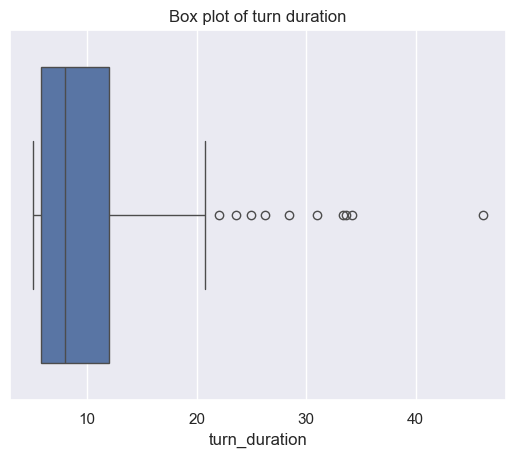

In [13]:
# box plot turn duration
sns.boxplot(x=df['turn_duration'])
plt.title('Box plot of turn duration')
plt.show()

In [14]:
df['normalized_walking_direction_dtw'] = df['walking_direction_dtw'] / (df['turn_duration'] / 0.2)
df['normalized_speeds_dtw'] = df['speeds_dtw'] / (df['turn_duration'] / 0.2)

In [15]:
df['abs_walking_direction_lag'] = df['walking_direction_lag'].abs()
df['abs_speeds_lag'] = df['speeds_lag'].abs()

In [16]:
relevant_features = [
       'turn_duration', 
       'mean_distance',
       'mean_pace_asymmetry',
       'walking_direction_lag', 
       'abs_walking_direction_lag',
       'walking_direction_dtw', 
       'normalized_walking_direction_dtw', 
       # 'walking_direction_base_corr', 
       'walking_direction_lagged_corr', 
       # 'mean_walking_direction_difference', 
       'speeds_lag', 
       'abs_speeds_lag',
       'speeds_dtw', 
       'normalized_speeds_dtw', 
       # 'speeds_base_corr', 
       'speeds_lagged_corr', 
       # 'mean_speed_difference',
       ]

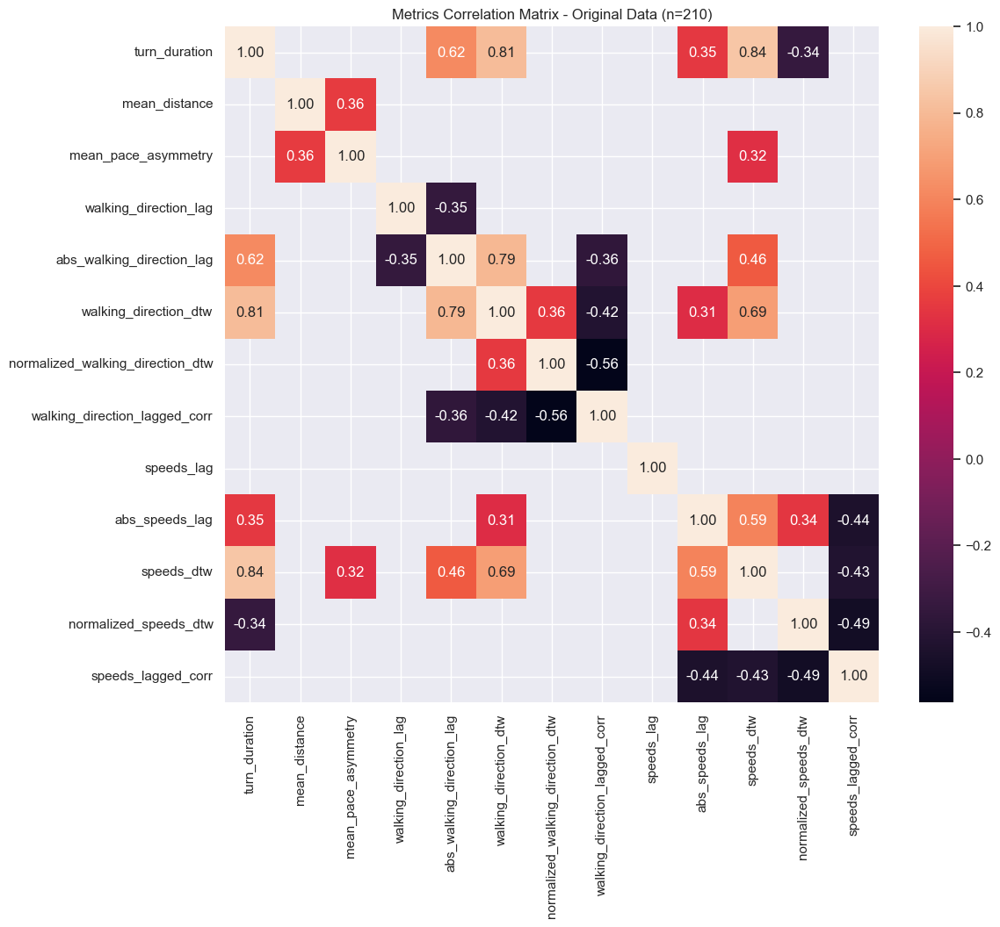

In [17]:
corr = df[relevant_features].corr(method='pearson',numeric_only=True)
mask = np.abs(corr) < 0.3
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", mask=mask)
# make it bigger
plt.title(f"Metrics Correlation Matrix - Original Data (n={len(df)})")
plt.show()

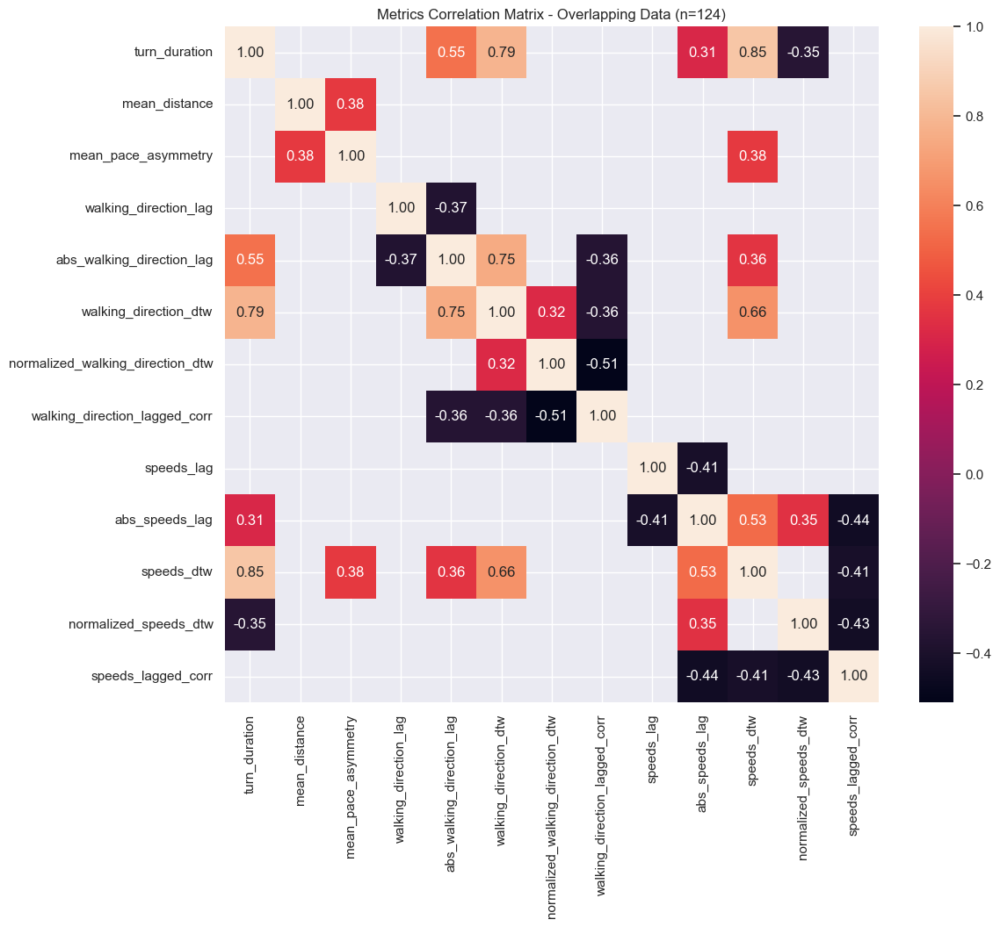

In [18]:
# find rows with the same participant_id and path_num with overlapping start_idx and end_idx
df['overlapping'] = False
for index, row in df.iterrows():
    if len(df[(df['participant_id'] == row['participant_id']) & (df['path_num'] == row['path_num']) & (df['start_idx'] >= row['start_idx']) & (df['start_idx'] <= row['end_idx'])]) > 1 or \
        len(df[(df['participant_id'] == row['participant_id']) & (df['path_num'] == row['path_num']) & (df['end_idx'] >= row['start_idx']) & (df['end_idx'] <= row['end_idx'])]) > 1:
        df.at[index, 'overlapping'] = True
    
overlapping_and_not_subset = df[df['overlapping'] == True]
# overlapping_and_not_subset = df
oans = overlapping_and_not_subset

corr_oans = oans[relevant_features].corr(method='pearson',numeric_only=True)
mask = np.abs(corr_oans) < 0.3
plt.figure(figsize=(12, 10))
sns.heatmap(corr_oans, annot=True, fmt=".2f", mask=mask)
plt.title(f"Metrics Correlation Matrix - Overlapping Data (n={len(oans)})")
plt.show()

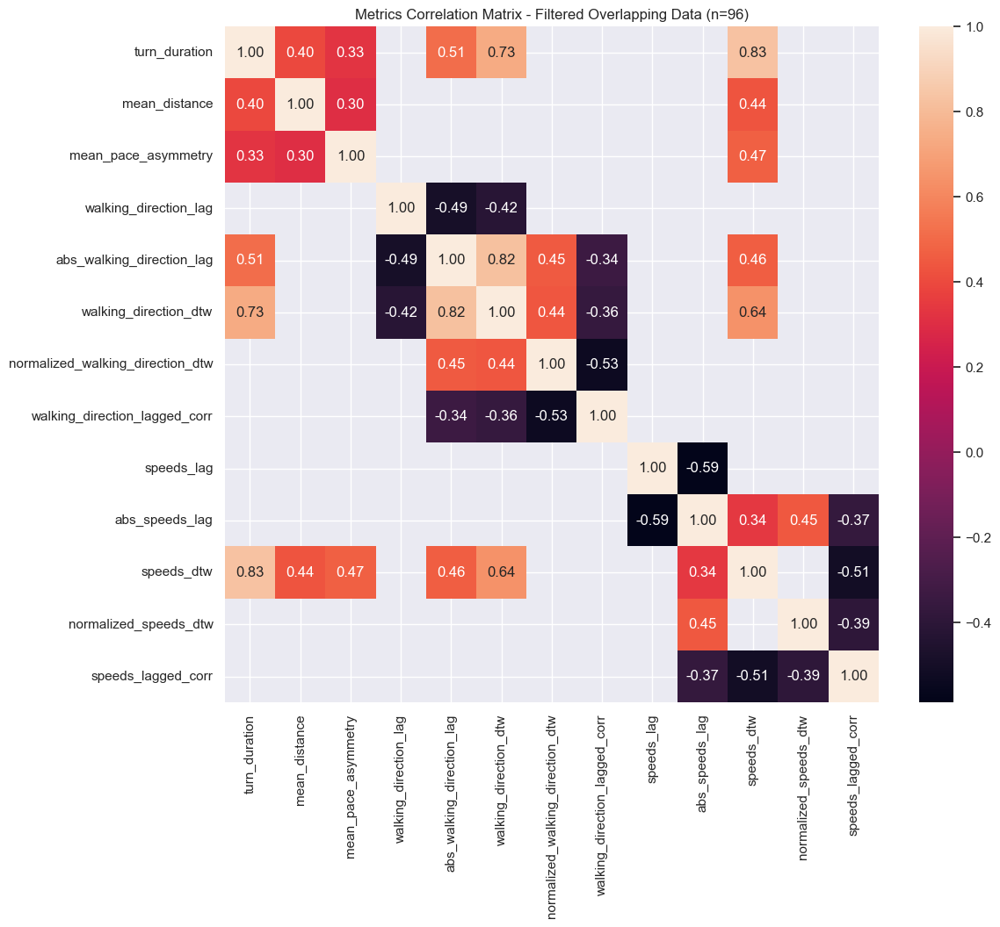

In [19]:
threshold = 0.3
filtered_df = df[(df['walking_direction_lagged_corr'] > threshold) & (df['speeds_lagged_corr'] > threshold)]
filtered_oans = filtered_df[filtered_df['overlapping'] == True]
# filtered_oans = filtered_df

corr_filtered_oans = filtered_oans[relevant_features].corr(method='pearson',numeric_only=True)
mask = (np.abs(corr_filtered_oans) < 0.3) 
plt.figure(figsize=(12, 10))
sns.heatmap(corr_filtered_oans, annot=True, fmt=".2f", mask=mask)
plt.title(f"Metrics Correlation Matrix - Filtered Overlapping Data (n={len(filtered_oans)})")
plt.show()

In [20]:
filtered_oans.describe().T

,count,mean,std,min,25%,50%,75%,max
participant_id,96.0,1822.364583,636.073748,407.000000,2101.750000,2104.000000,2107.000000,2111.000000
path_num,96.0,2.218750,0.728418,1.000000,2.000000,2.000000,3.000000,3.000000
turn_num,96.0,2.375000,1.649561,1.000000,1.000000,2.000000,3.000000,8.000000
start_idx,96.0,473.281250,387.076266,54.000000,223.500000,394.500000,579.250000,2129.000000
end_idx,96.0,529.791667,384.969470,108.000000,295.500000,445.500000,638.500000,2179.000000
walking_direction_lag,96.0,-6.208333,22.130197,-79.000000,-17.000000,-2.500000,5.250000,47.000000
walking_direction_base_corr,96.0,0.044735,0.433912,-0.857578,-0.342859,0.079463,0.436595,0.852908
walking_direction_lagged_corr,96.0,0.489776,0.142875,0.307794,0.375805,0.447162,0.588371,0.955078
walking_direction_dtw,96.0,48.883543,27.746676,4.239983,27.611524,45.737083,57.678972,162.955230
speeds_lag,96.0,-3.989583,11.887627,-48.000000,-9.000000,-1.500000,0.250000,23.000000


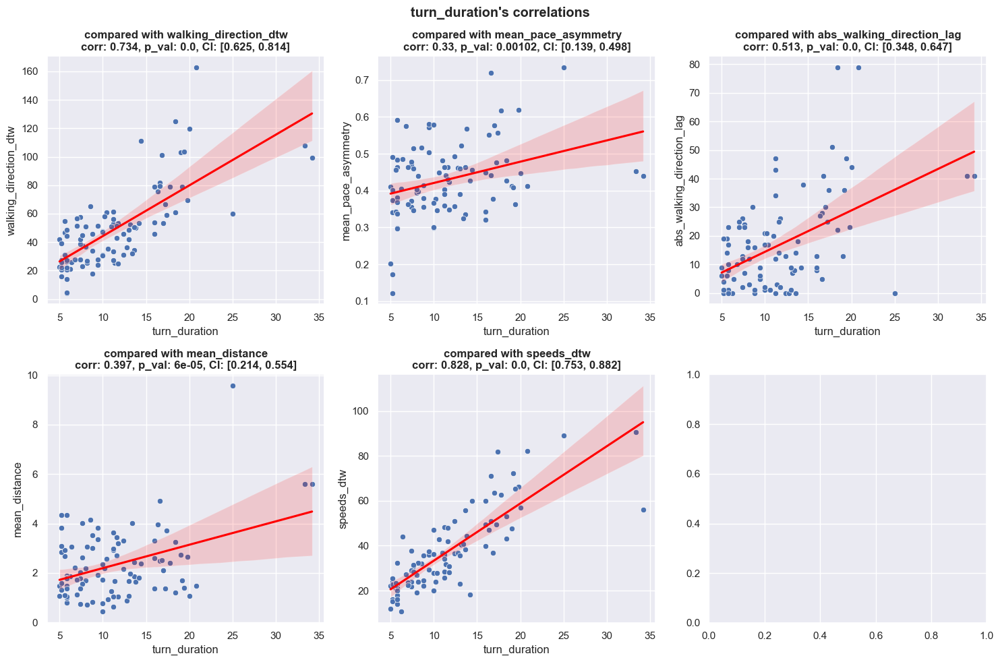

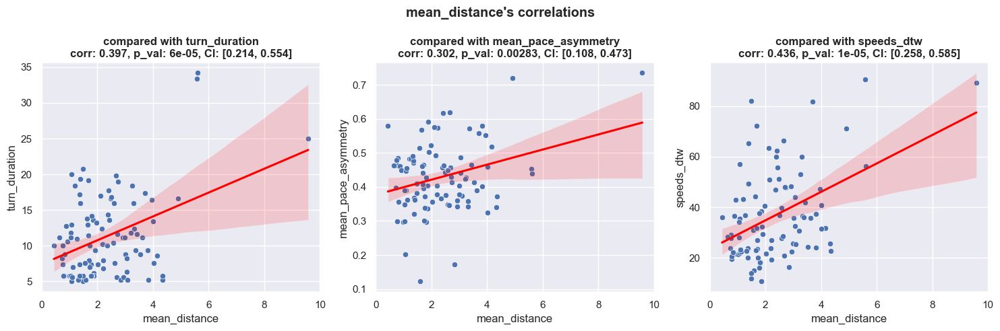

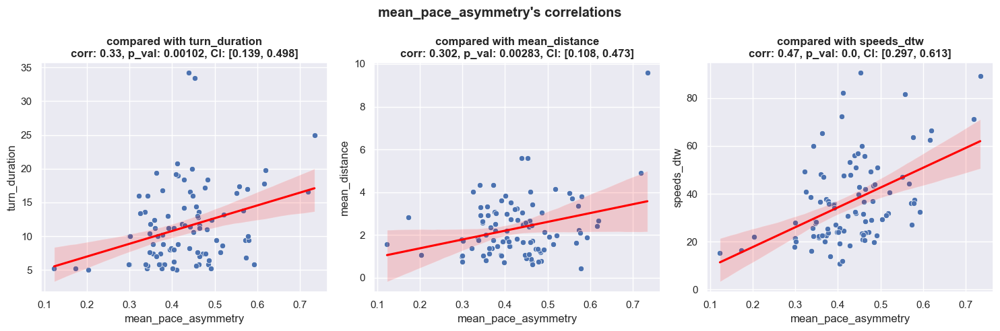

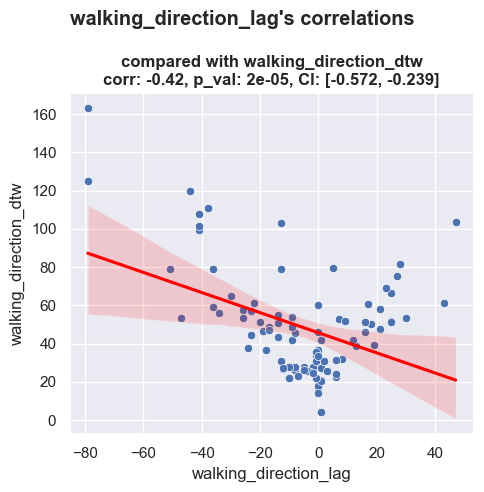

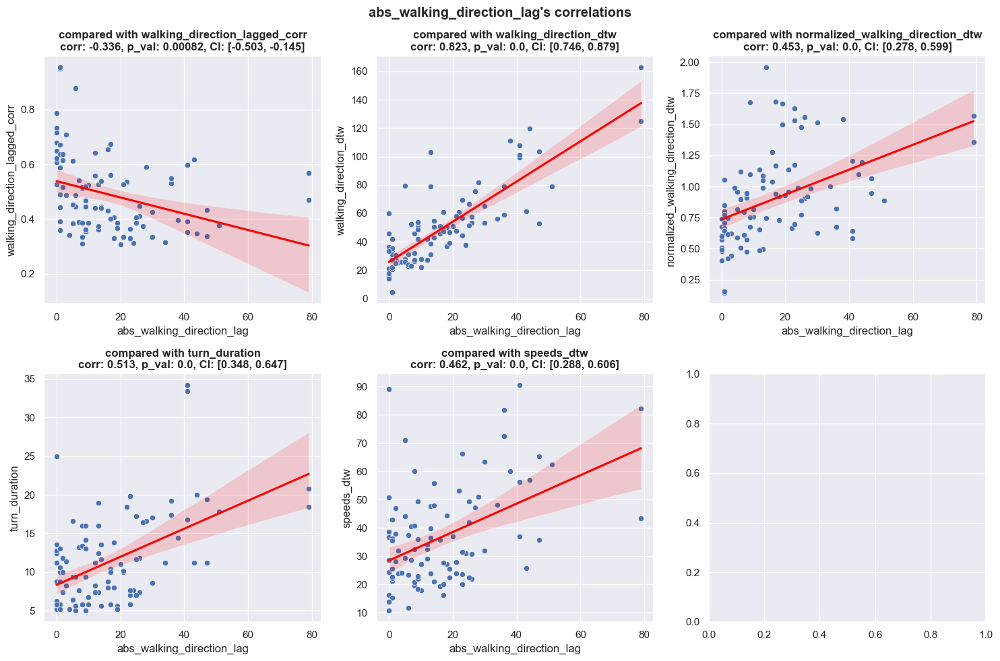

...

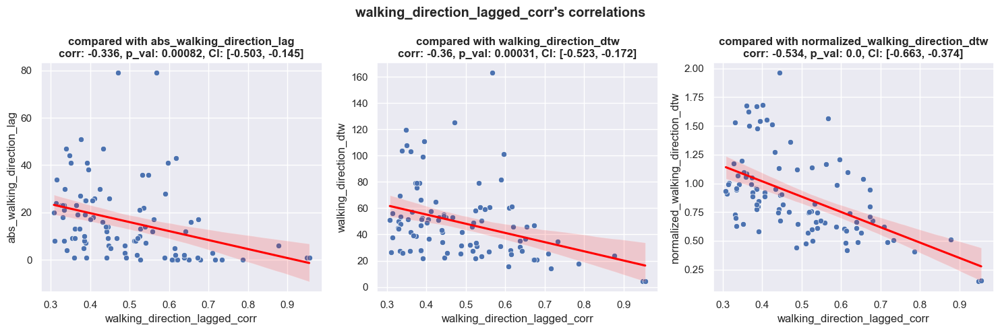

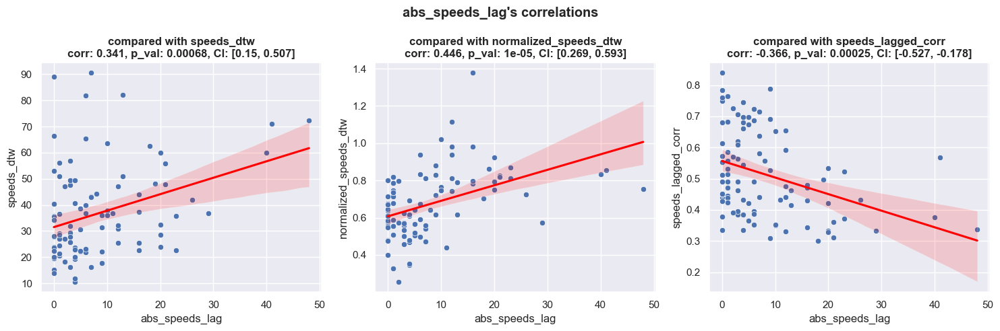

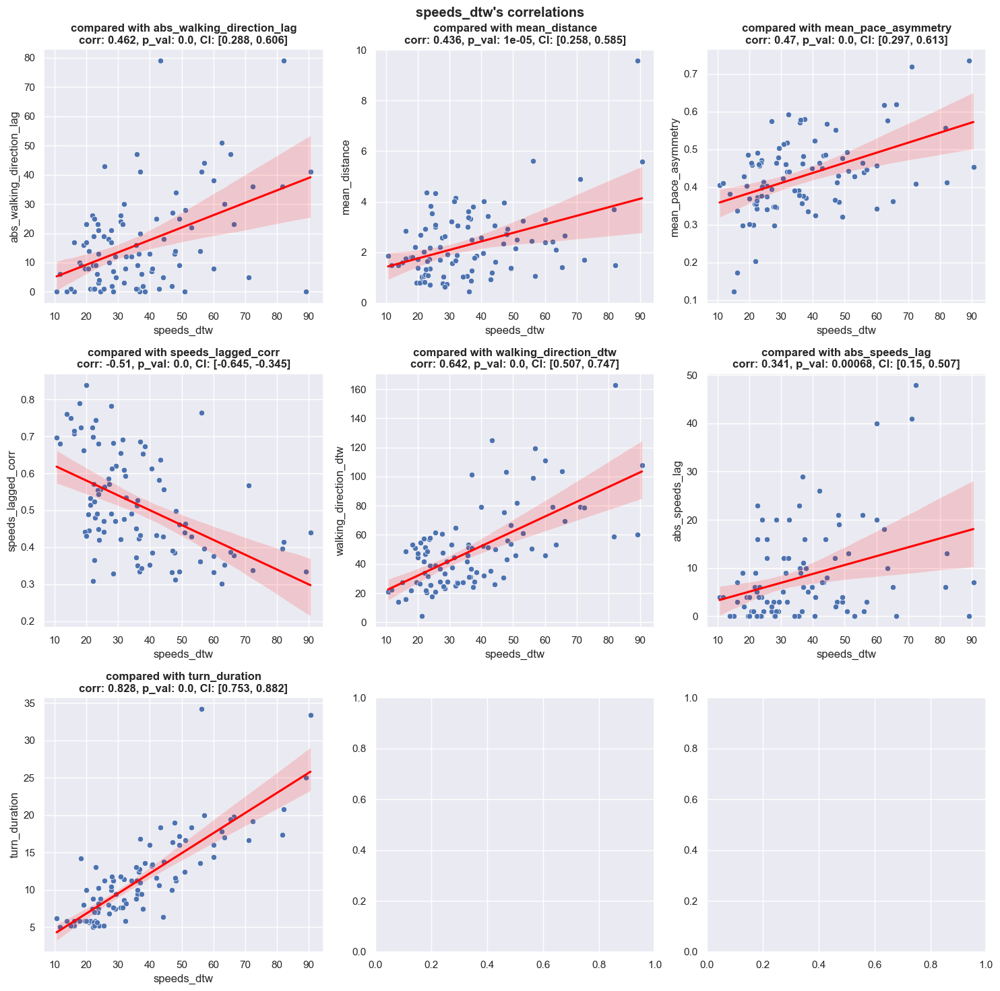

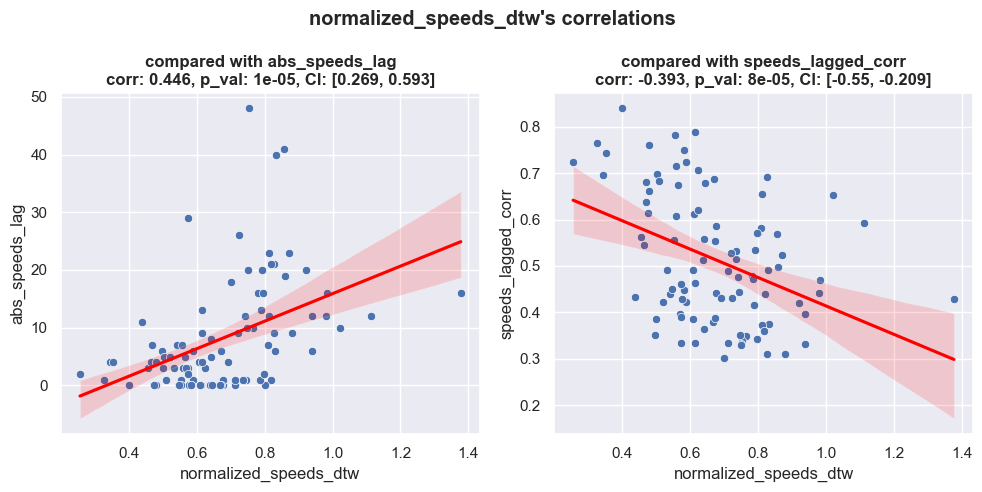

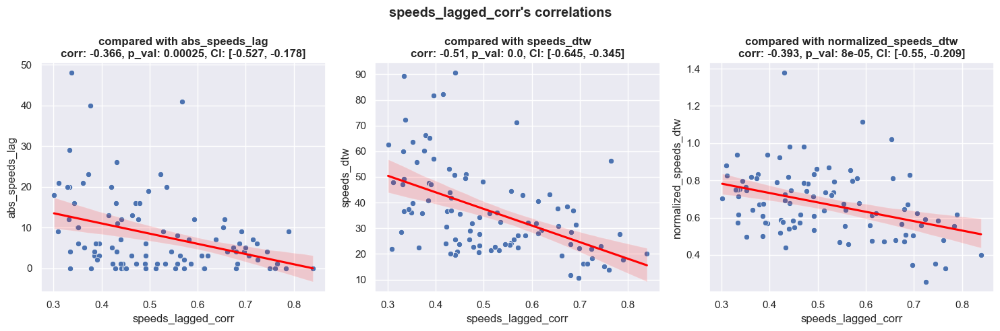

In [21]:
from scipy.stats import pearsonr

for feature in relevant_features:
    to_display = []
    for feature2 in relevant_features:
        if not feature.startswith(feature2) and not feature2.startswith(feature) and not feature.endswith(feature2) and not feature2.endswith(feature)\
            and np.abs(corr_filtered_oans.loc[feature, feature2]) > 0.3:
            to_display.append(feature2)
    if len(to_display) == 0:
        continue
    # set plot grid of 1xlen(to_display)
    fig, axs = plt.subplots(int(np.ceil(len(to_display)/3)), min(len(to_display),3), figsize=(5*min(len(to_display),3),5*int(np.ceil(len(to_display)/3))))
    # print(axs.shape)
    axs = np.atleast_2d(axs)  # Ensure axs is always an array, even if it's a single subplot
    for i, feature2 in enumerate(to_display):
        peares = pearsonr(filtered_oans[feature], filtered_oans[feature2], alternative='two-sided')
        pcorr, p_val = peares.statistic, peares.pvalue
        CI = peares.confidence_interval(confidence_level=0.95)
        # Scatter plot
        sns.scatterplot(x=feature, y=feature2, data=filtered_oans, ax=axs[int(np.ceil(i/3))-1,i%3])
        # Regression line
        sns.regplot(x=feature, y=feature2, data=filtered_oans, scatter=False, line_kws={'color': 'red'}, ax=axs[int(np.ceil(i/3))-1,i%3])
        axs[int(np.ceil(i/3))-1,i%3].set_title(f"compared with {feature2}\ncorr: {round(corr_filtered_oans.loc[feature, feature2], 3)}, p_val: {round(p_val,5)}, CI: {[round(c,3) for c in CI]}", fontweight='bold')
    # add title "feature vs correlated features" to the plot
    fig.suptitle(f"{feature}'s correlations", fontweight='bold')
    plt.tight_layout()
    plt.show()


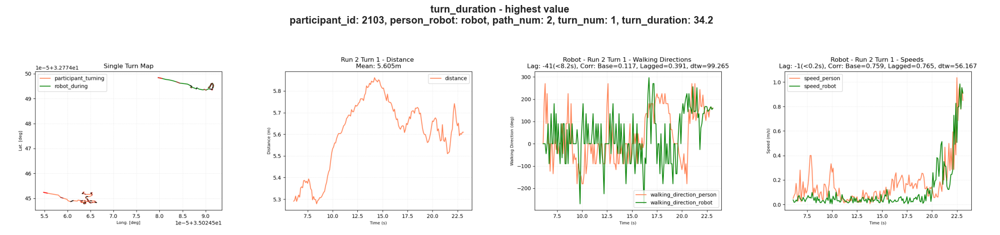

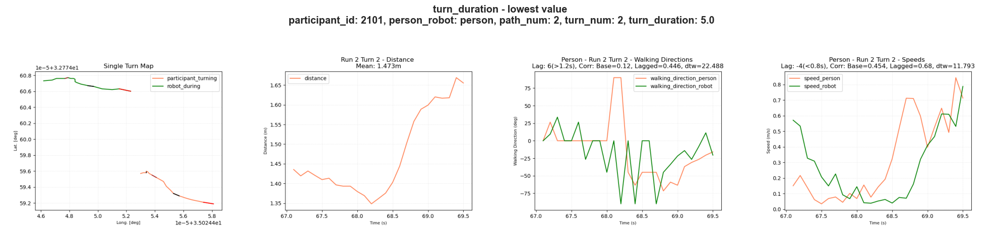

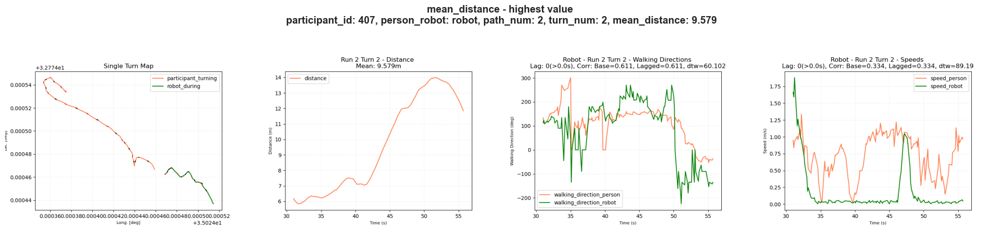

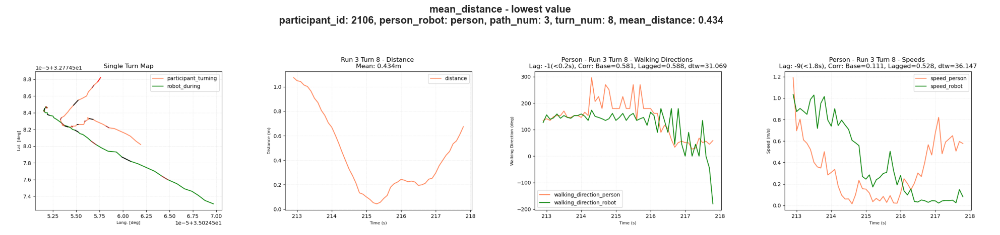

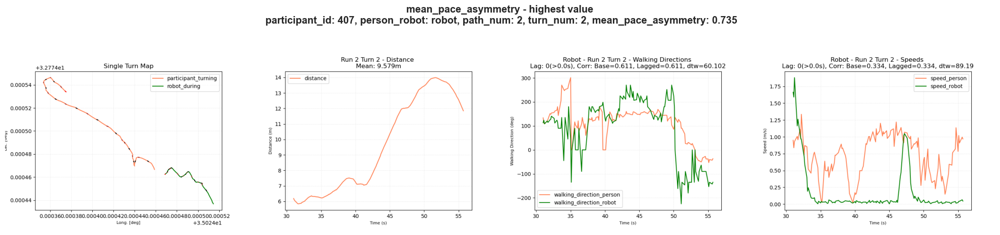

...

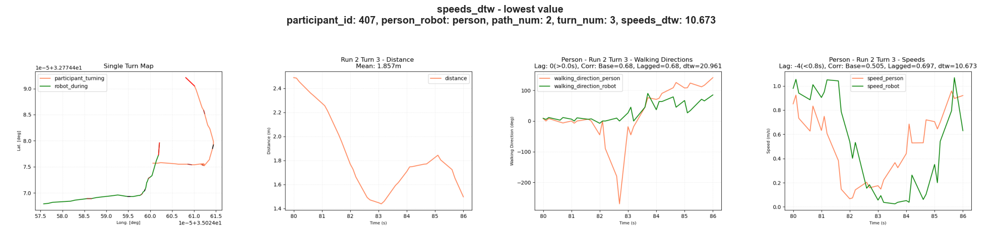

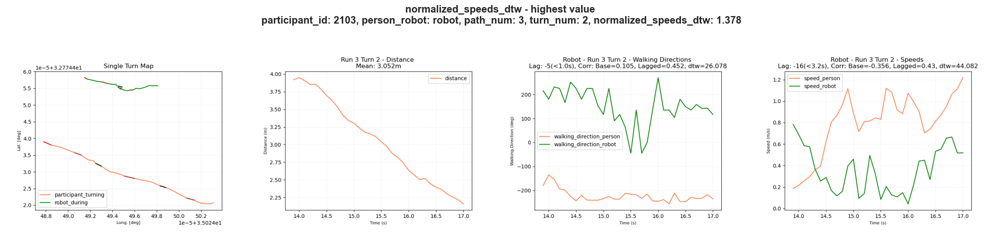

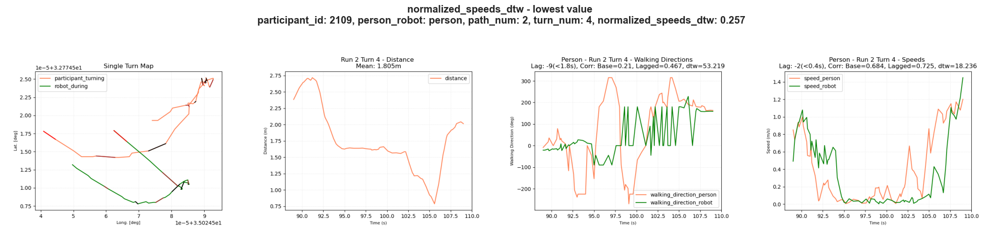

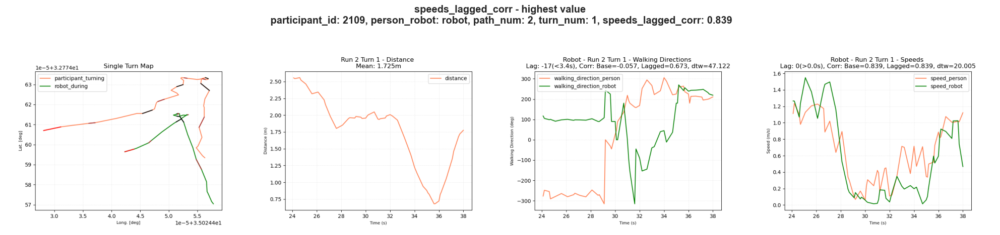

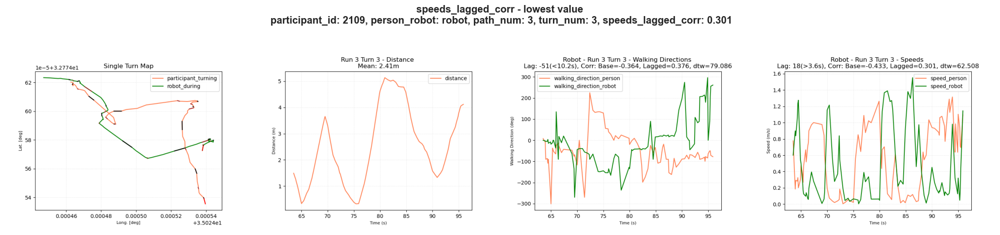

In [22]:
from PIL import Image
import seaborn as sns
from scipy import stats
# for each feature, find highest and lowest valued row and display them
for feature in relevant_features:
    # print(f"Feature: {feature}")
    # print("Highest values:")
    
    h_res = filtered_oans.loc[filtered_oans[feature].nlargest(1).index, ['participant_id', 'person_robot', 'path_num', 'turn_num', feature]]
    # print(h_res)
    h_base_path = f"./turns/{h_res['participant_id'].values[0]}/{h_res['person_robot'].values[0]}/run_{h_res['path_num'].values[0]}/turn_{h_res['turn_num'].values[0]}/"
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    paths_img = Image.open(h_base_path + "paths.png")
    axs[0].imshow(paths_img)
    axs[0].axis('off')
    distance_img = Image.open(h_base_path + "distance.png")
    axs[1].imshow(distance_img)
    axs[1].axis('off')
    walking_directions_img = Image.open(h_base_path + "walking_directions.png")
    axs[2].imshow(walking_directions_img)
    axs[2].axis('off')
    speeds_img = Image.open(h_base_path + "speeds.png")
    axs[3].imshow(speeds_img)
    axs[3].axis('off')
    to_print_dict = {k: round(v_val, 3) if isinstance(v_val, float) else v_val for k,v in h_res.to_dict().items() for v_key, v_val in v.items()}
    to_print_str = ", ".join([f"{k}: {v}" for k,v in to_print_dict.items()])
    fig.suptitle(f"{feature} - highest value\n {to_print_str}", fontweight='bold')
    plt.tight_layout()
    plt.show()
    # print("Lowest values:")
    l_res = filtered_oans.loc[filtered_oans[feature].nsmallest(1).index, ['participant_id', 'person_robot', 'path_num', 'turn_num', feature]]
    # print(l_res)
    l_base_path = f"./turns/{l_res['participant_id'].values[0]}/{l_res['person_robot'].values[0]}/run_{l_res['path_num'].values[0]}/turn_{l_res['turn_num'].values[0]}/"
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    paths_img = Image.open(l_base_path + "paths.png")
    axs[0].imshow(paths_img)
    axs[0].axis('off')
    distance_img = Image.open(l_base_path + "distance.png")
    axs[1].imshow(distance_img)
    axs[1].axis('off')
    walking_directions_img = Image.open(l_base_path + "walking_directions.png")
    axs[2].imshow(walking_directions_img)
    axs[2].axis('off')
    speeds_img = Image.open(l_base_path + "speeds.png")
    axs[3].imshow(speeds_img)
    axs[3].axis('off')
    to_print_dict = {k: round(v_val, 3) if isinstance(v_val, float) else v_val for k,v in l_res.to_dict().items() for v_key, v_val in v.items()}
    to_print_str = ", ".join([f"{k}: {v}" for k,v in to_print_dict.items()])
    fig.suptitle(f"{feature} - lowest value\n {to_print_str}", fontweight='bold')
    plt.tight_layout()
    plt.show()
    print("\n\n")

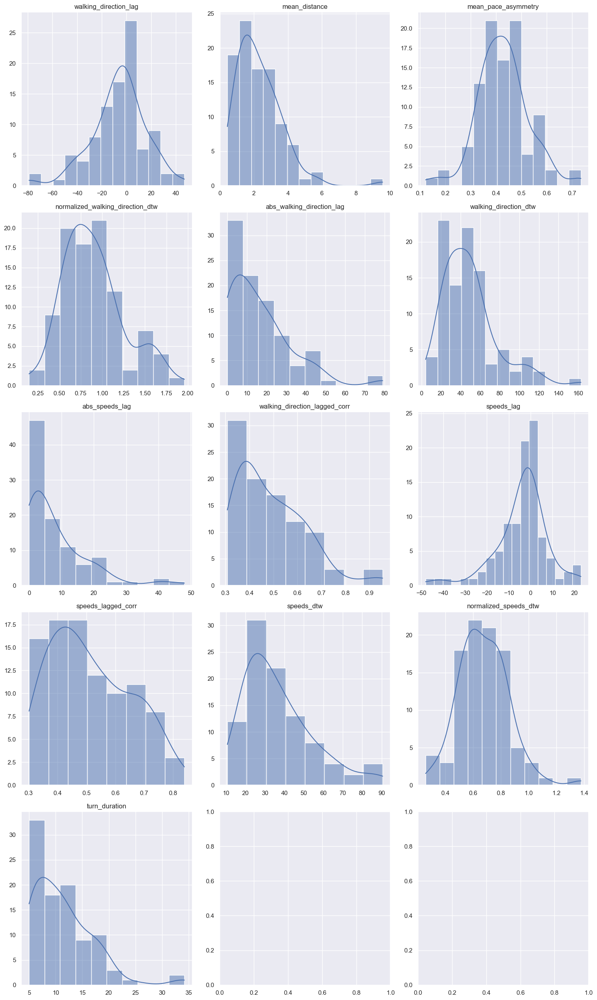

In [23]:
fig, axs = plt.subplots(int(np.ceil(len(relevant_features)/3)), min(len(relevant_features),3), figsize=(15, 5*int(np.ceil(len(relevant_features)/3))))
axs = np.atleast_2d(axs)  # Ensure axs is always an array, even if it's a single subplot

for i, feature in enumerate(relevant_features):
    sns.histplot(data=filtered_oans, x=feature, kde=True, ax=axs[int(np.ceil(i/3))-1,i%3])
    axs[int(np.ceil(i/3))-1,i%3].set_title(feature)
    axs[int(np.ceil(i/3))-1,i%3].set_xlabel('')
    axs[int(np.ceil(i/3))-1,i%3].set_ylabel('')

plt.tight_layout()
plt.show()


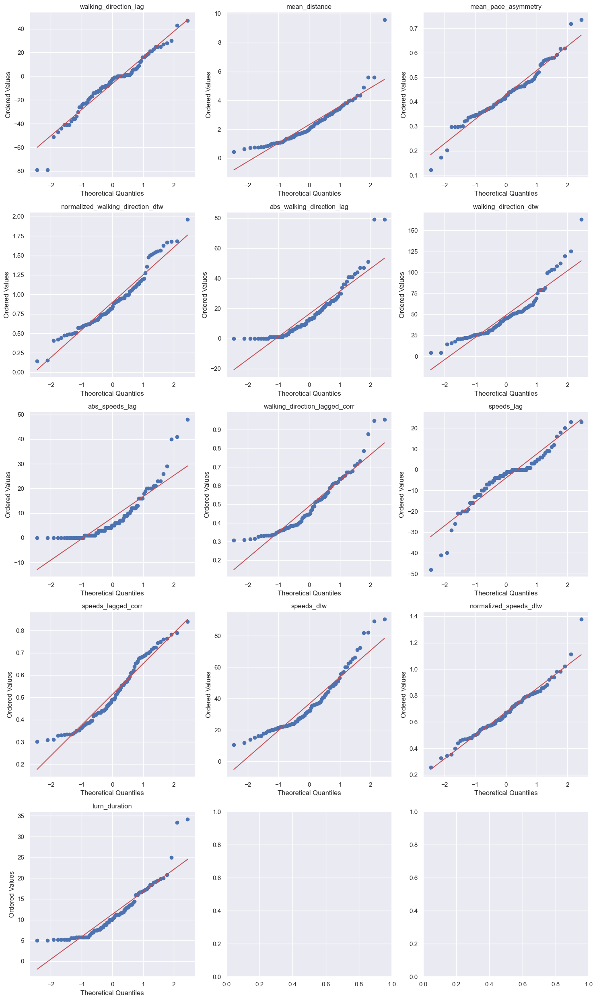

In [24]:
import scipy.stats as stats

fig, axs = plt.subplots(int(np.ceil(len(relevant_features)/3)), min(len(relevant_features),3), figsize=(15, 5*int(np.ceil(len(relevant_features)/3))))
axs = np.atleast_2d(axs)  # Ensure axs is always an array, even if it's a single subplot

for i, feature in enumerate(relevant_features):
    stats.probplot(filtered_oans[feature], dist="norm", plot=axs[int(np.ceil(i/3))-1,i%3])
    axs[int(np.ceil(i/3))-1,i%3].set_title(feature)
    axs[int(np.ceil(i/3))-1,i%3].set_xlabel('Theoretical Quantiles')
    axs[int(np.ceil(i/3))-1,i%3].set_ylabel('Ordered Values')

plt.tight_layout()
plt.show()

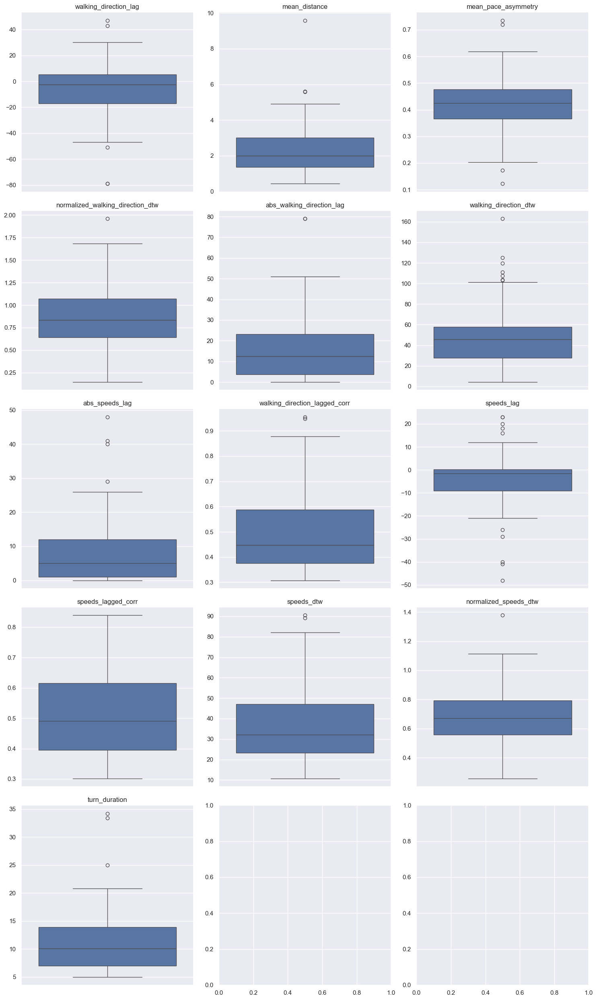

In [25]:
fig, axs = plt.subplots(int(np.ceil(len(relevant_features)/3)), min(len(relevant_features),3), figsize=(15, 5*int(np.ceil(len(relevant_features)/3))))
axs = np.atleast_2d(axs)  # Ensure axs is always an array, even if it's a single subplot

for i, feature in enumerate(relevant_features):
    sns.boxplot(data=filtered_oans, y=feature, ax=axs[int(np.ceil(i/3))-1,i%3])
    axs[int(np.ceil(i/3))-1,i%3].set_title(feature)
    axs[int(np.ceil(i/3))-1,i%3].set_xlabel('')
    axs[int(np.ceil(i/3))-1,i%3].set_ylabel('')

plt.tight_layout()
plt.show()

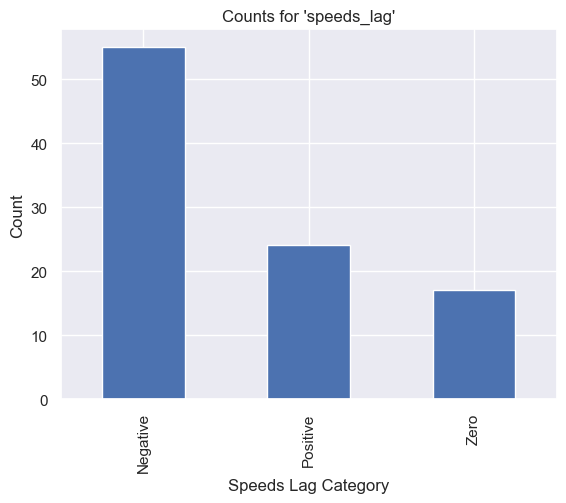

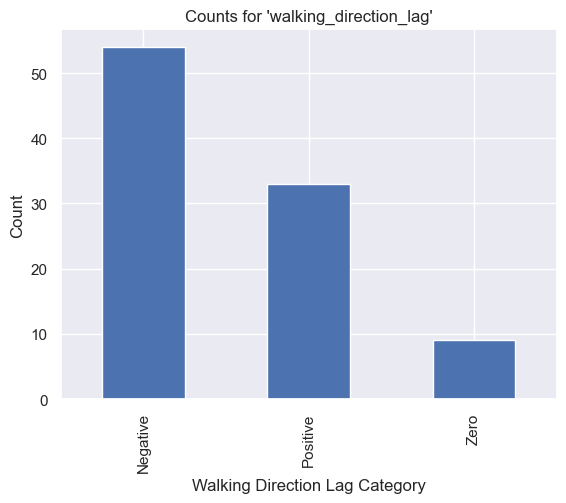

In [26]:
# Count for 'speeds_lag'
speeds_lag_counts = filtered_oans['speeds_lag'].apply(lambda x: 'Negative' if x < 0 else ('Zero' if x == 0 else 'Positive')).value_counts()

# Count for 'walking_speed_lag'
walking_speed_lag_counts = filtered_oans['walking_direction_lag'].apply(lambda x: 'Negative' if x < 0 else ('Zero' if x == 0 else 'Positive')).value_counts()

speeds_lag_counts.plot.bar()
plt.title("Counts for 'speeds_lag'")
plt.xlabel("Speeds Lag Category")
plt.ylabel("Count")
plt.show()

walking_speed_lag_counts.plot.bar()
plt.title("Counts for 'walking_direction_lag'")
plt.xlabel("Walking Direction Lag Category")
plt.ylabel("Count")
plt.show()
